In [1]:
import scvelo as scv
import numpy as np
import pandas as pd
import scanpy as sc
import loompy
import matplotlib as mpl
import matplotlib.pyplot as pl

import collections.abc
#cellrank needs the following alias to be done manually.
collections.Iterable = collections.abc.Iterable
import cellrank as cr
from scipy.stats import mode
from collections import Counter
from matplotlib import rcParams
#import diffxpy as de
#import palantir
import seaborn
import warnings
import scanpy.external as sce


In [2]:
#settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(color_map='viridis')
sc.settings.set_figure_params(dpi=80, facecolor='white')
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [3]:
#results file
results_file = 'C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/ScVelo/scanpy/JupyterCocktail_Scanpy.h5ad'  # the file that will store the analysis results

In [4]:
#read h5 OR h5ac
adata = sc.read_10x_h5(filename = 'C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/Controls/Control_filtered_feature_bc_matrix.h5')
#adata = sc.read_h5ad(filename = '/Users/renevielman/OneDrive - Creighton University/Creighton/scRNAseq/Scanpy/Conversion.h5ad')
adata

reading C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/Controls/Control_filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 15963 × 32287
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
adata.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


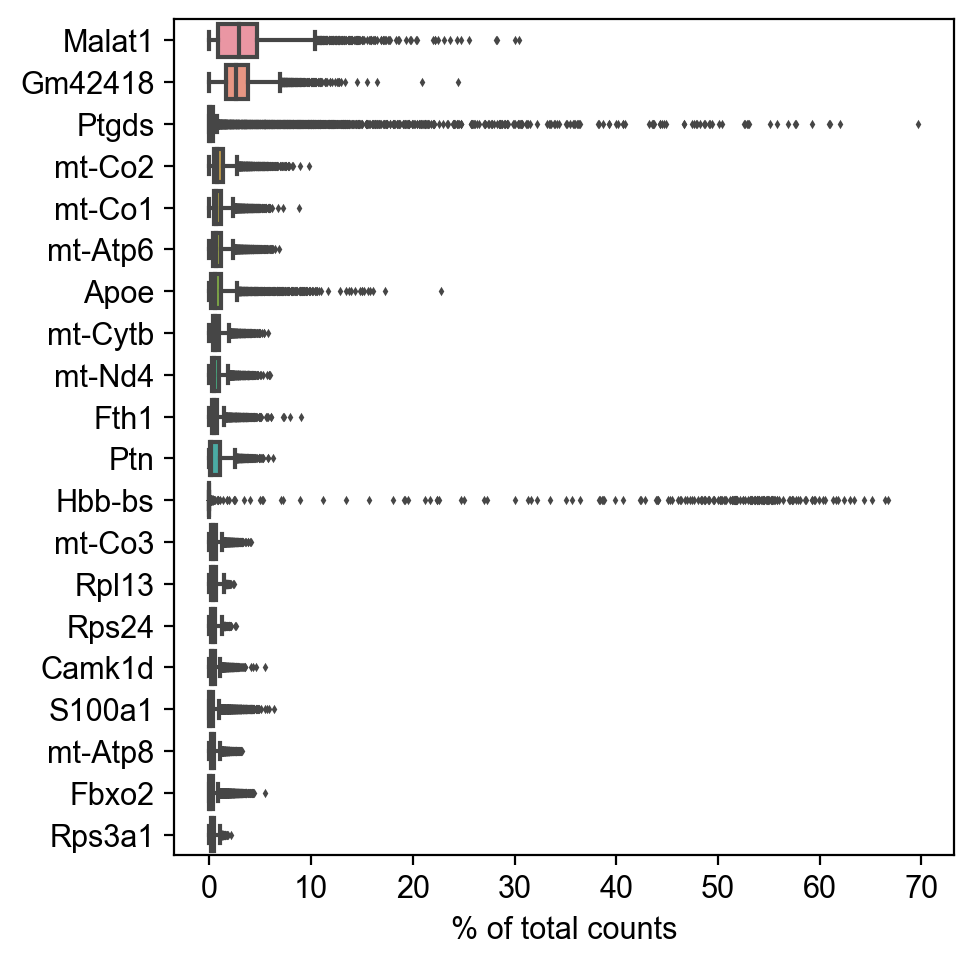

In [6]:
#highest expressed genes
sc.pl.highest_expr_genes(adata, n_top=20, )

filtered out 84 cells that have less than 200 genes expressed
filtered out 11519 genes that are detected in less than 3 cells


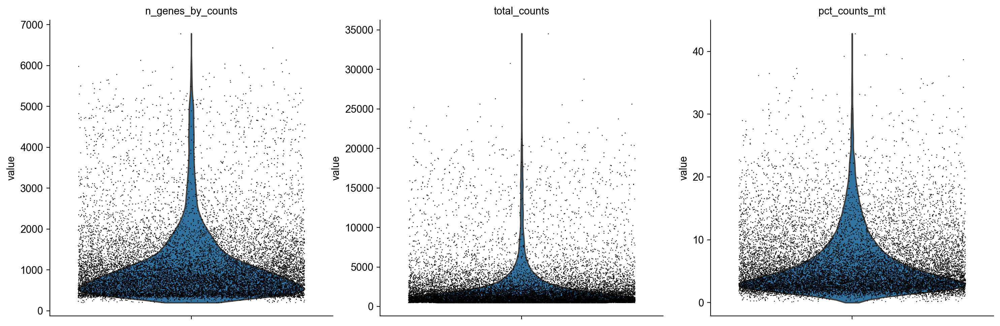

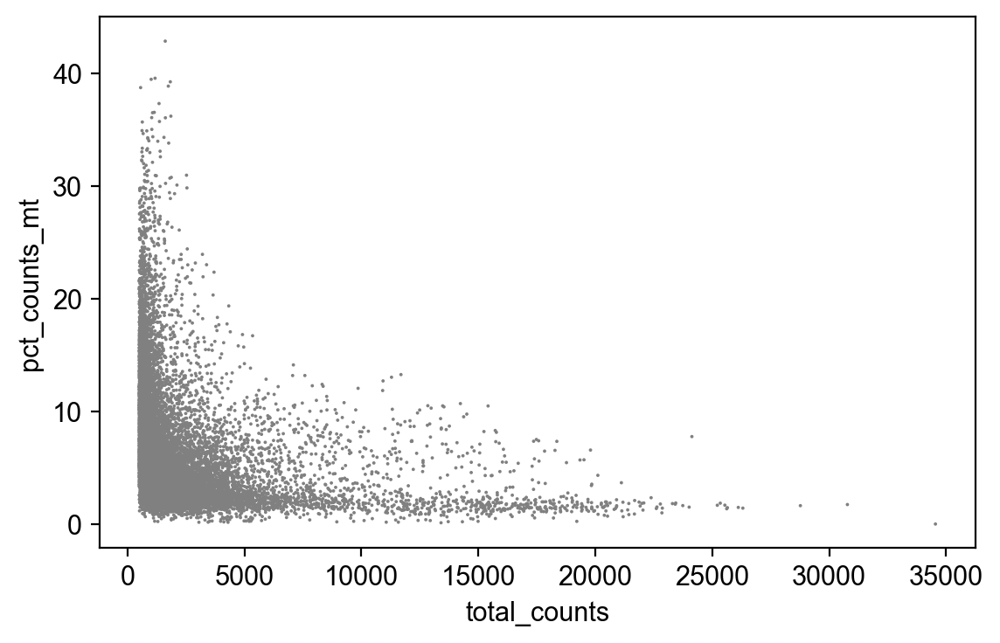

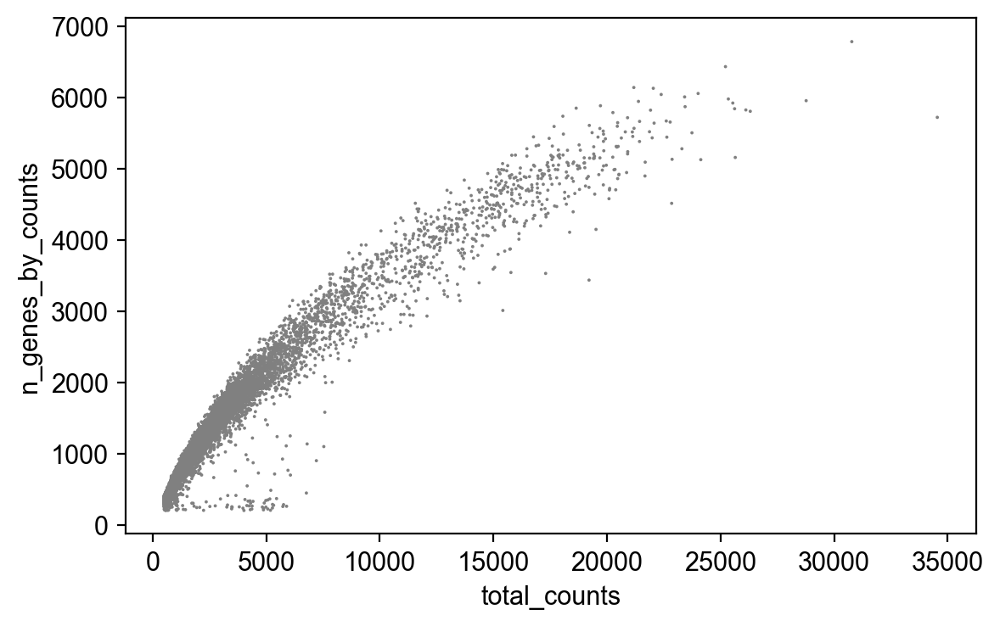

normalizing counts per cell
    finished (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [7]:
#filtering and normalization
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

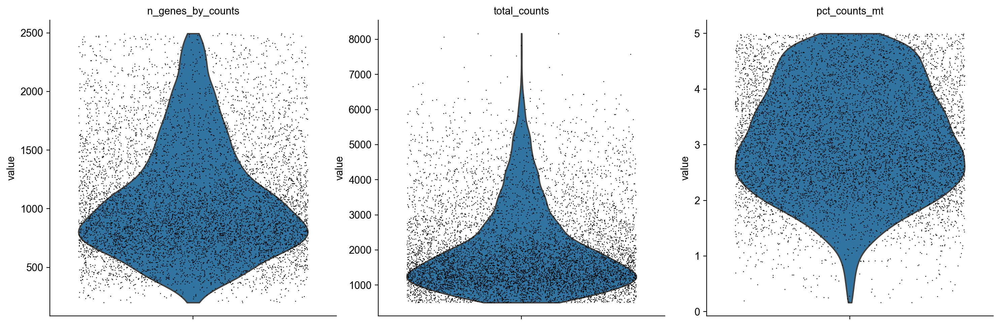

In [8]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


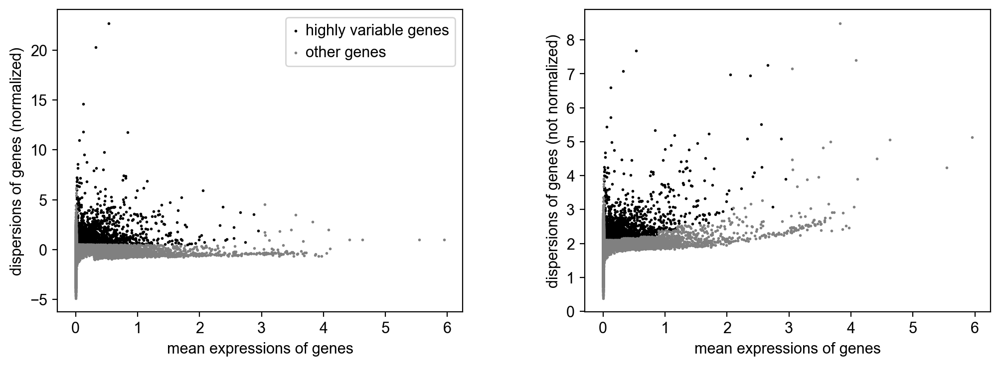

In [9]:
#identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [10]:
adata

AnnData object with n_obs × n_vars = 7899 × 20768
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [11]:
#set raw data
adata.raw = adata

In [12]:
#filtering, regression and scaling
adata = adata[:, adata.var.highly_variable]

In [13]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:16)


In [14]:
sc.pp.scale(adata, max_value=10)

In [15]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)


In [16]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


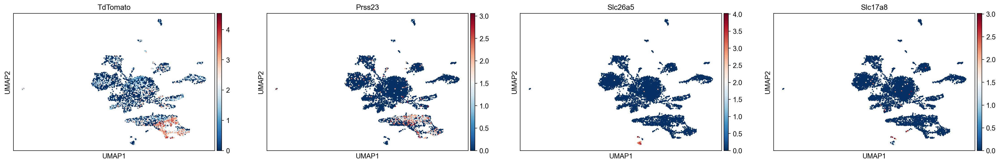

In [17]:
sc.tl.umap(adata) 
sc.pl.umap(adata, color=['TdTomato', 'Prss23', 'Slc26a5', 'Slc17a8']) 

In [24]:
sc.tl.leiden(adata, resolution=0.5)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


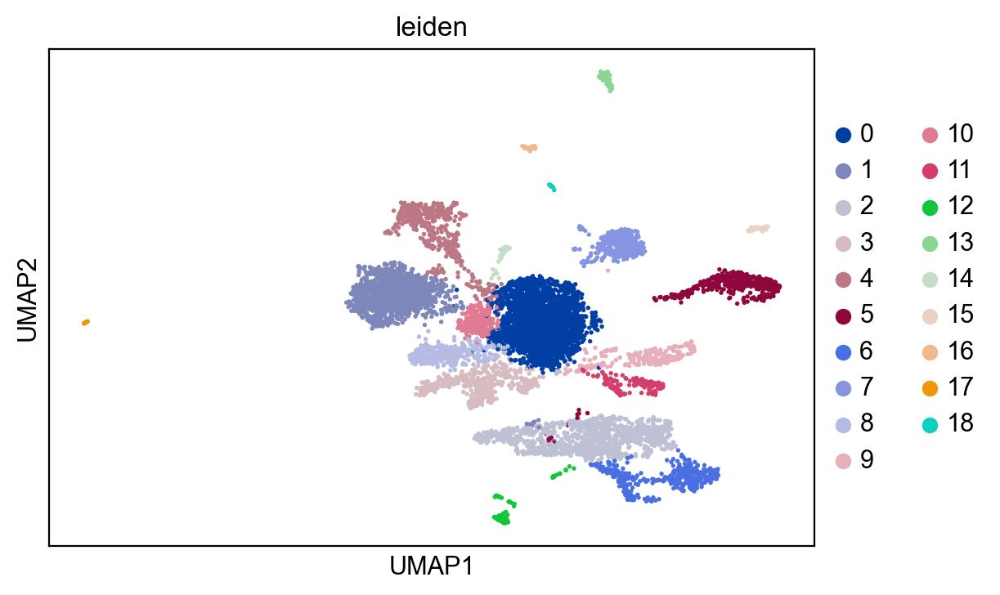

In [25]:
sc.pl.umap(adata, color = 'leiden')

In [26]:
marker_genes = ["TdTomato", "Sox2", "Sox9", "Sox10", "Lfng", "Cdkn1b", "Gjb2", "Prss23", "S100a6", 
                "S100a1", "Slc1a3", "Fst", "Fabp7", "Fgfr3", "Lgr5", "Gata3", "Spry2", "Myo6", 
                "Myo7a", "Slc26a5", "Slc17a8", "Otof", "Ocm", "Pvalb", "Calb2", "Ikzf2",
               "Tbx2", "Pou4f3", "Pcp4", "Espn", "Isl1", "Nefh", "Thy1", "Tubb3", "Cldn11", 
               "Met", "Dct", "Coch", "Emilin2", "Kcnq1", "Cx3cr1", "Cd3g", "Cd4", "Mpz", 
                  "Mbp", "Plp1", "Slc26a4", "Vmo1", "Itgam", "Cd79a", "Hba-a1", "Hba-a2"]

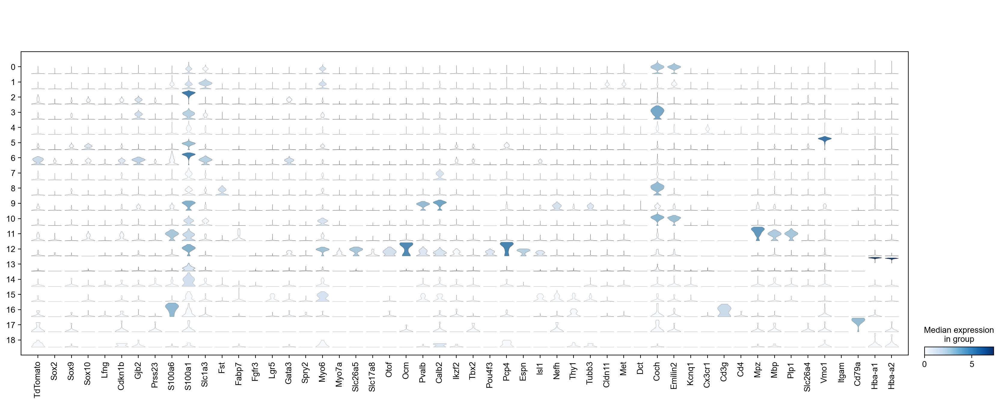

In [27]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90);

In [36]:
#rename clusters
new_cluster_names = ['TBC1', 'Basal Cells', 'SC1', 'Spiral Limbus', 'MP', 'RM', 'SC2',
                    'Root/Spindle Cells', 'Spiral Ligament', 'SGN', 'TBC2', 'Schwann', 'HC_cHC', 
                    'Hb+', 'Marginal1', 'Marginal2', 'T Cells', 'B Cells', '??']
adata.rename_categories('leiden', new_cluster_names)

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


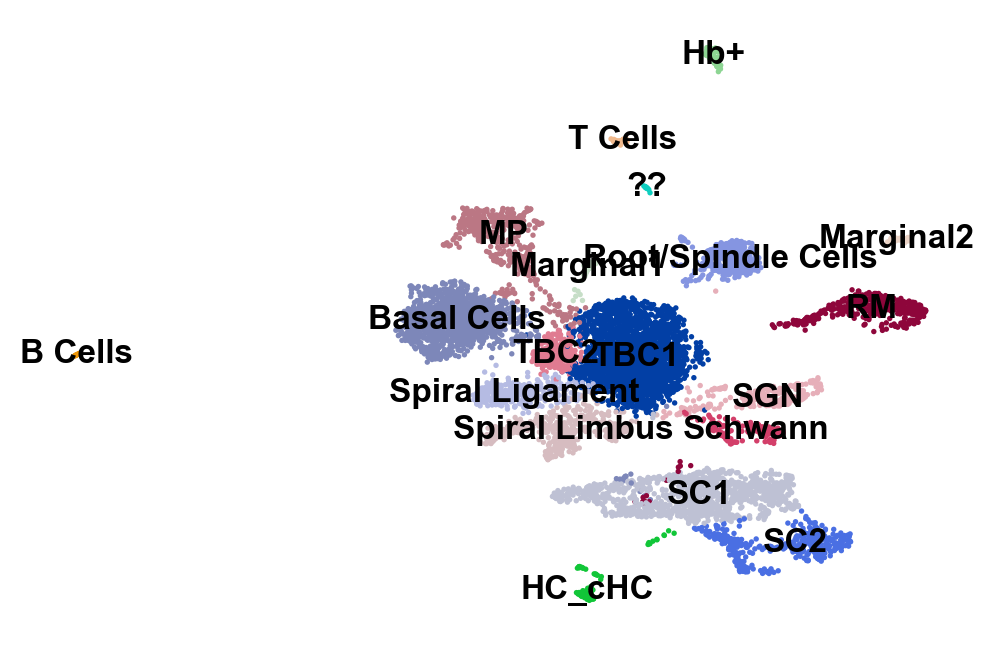

In [37]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


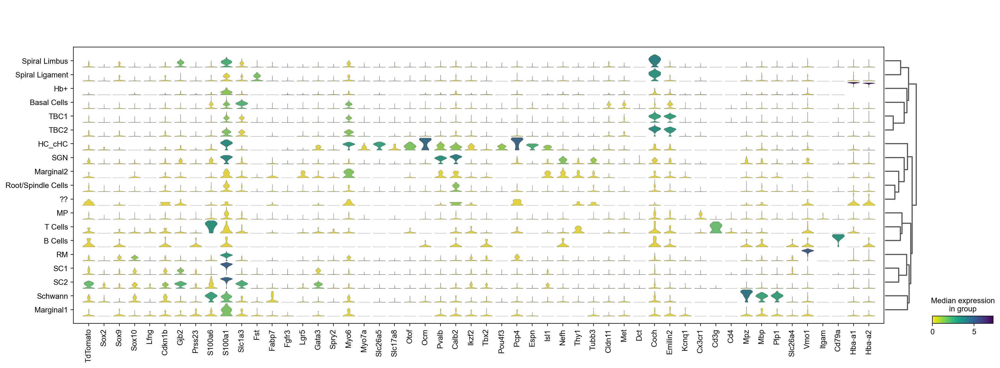

In [38]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90, dendrogram=True,
                      cmap='viridis_r');

In [39]:
#subset SC, cHC, HC
adata_subset = adata[adata.obs['leiden'].isin(['HC_cHC', 'SC1', 'SC2'])]

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


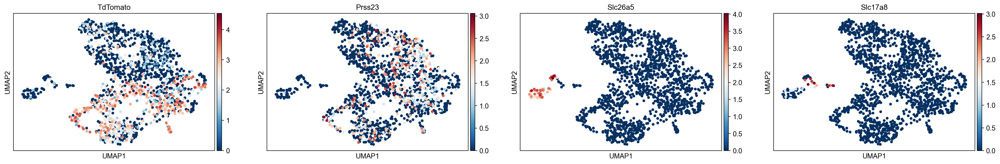

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


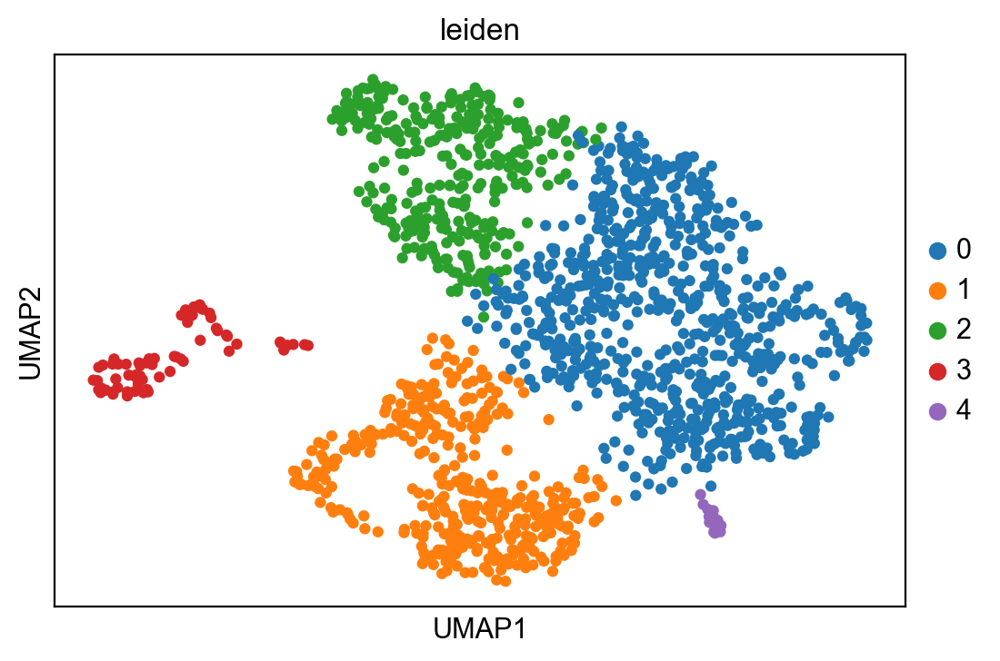

In [46]:
sc.pp.neighbors(adata_subset, n_neighbors=10, n_pcs=20)
sc.tl.pca(adata_subset, svd_solver='arpack')
sc.tl.umap(adata_subset) 
sc.pl.umap(adata_subset, color=['TdTomato', 'Prss23', 'Slc26a5', 'Slc17a8']) 
sc.tl.leiden(adata_subset, resolution = 0.15)
sc.pl.umap(adata_subset, color = 'leiden')

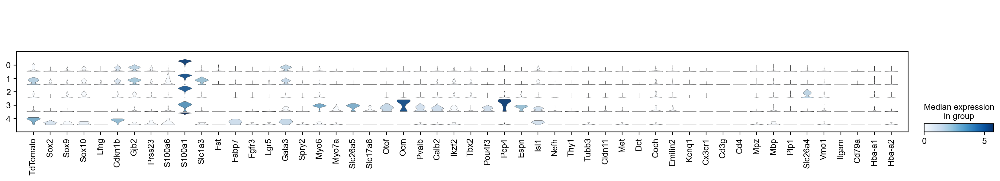

In [47]:
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden', rotation=90);

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


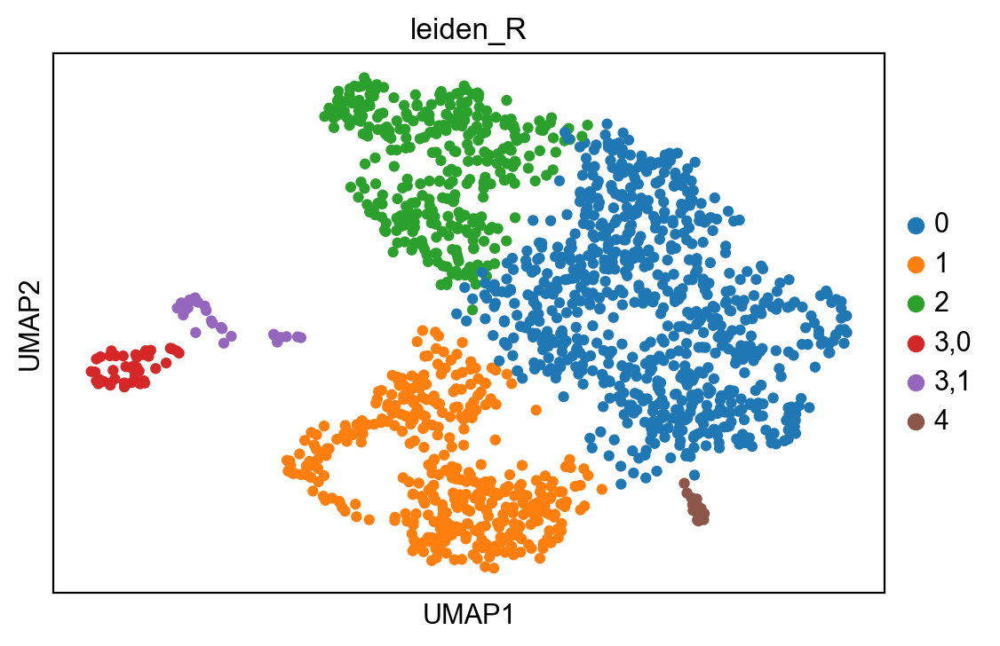

In [58]:
sc.tl.leiden(adata_subset, resolution = 0.25, restrict_to=('leiden', ['3']))
sc.pl.umap(adata_subset, color = 'leiden_R')

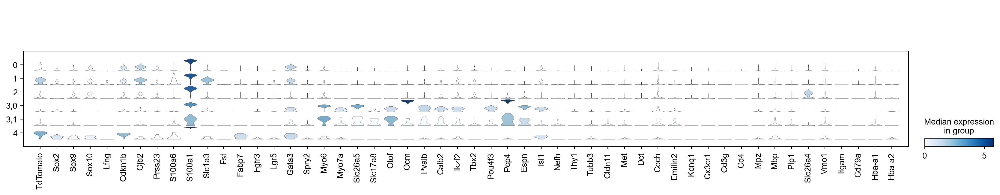

In [59]:
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden_R', rotation=90);

In [60]:
adata_subset.obs["leiden_R"].value_counts()

leiden_R
0      731
1      385
2      328
3,0     40
3,1     27
4       16
Name: count, dtype: int64

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_R']`


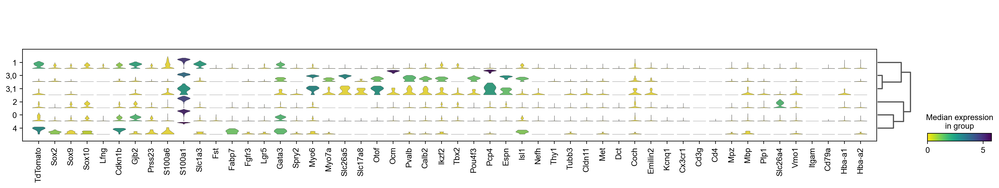

In [61]:
sc.tl.dendrogram(adata_subset, groupby='leiden_R')
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden_R', rotation=90, dendrogram=True,
                      cmap='viridis_r');

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


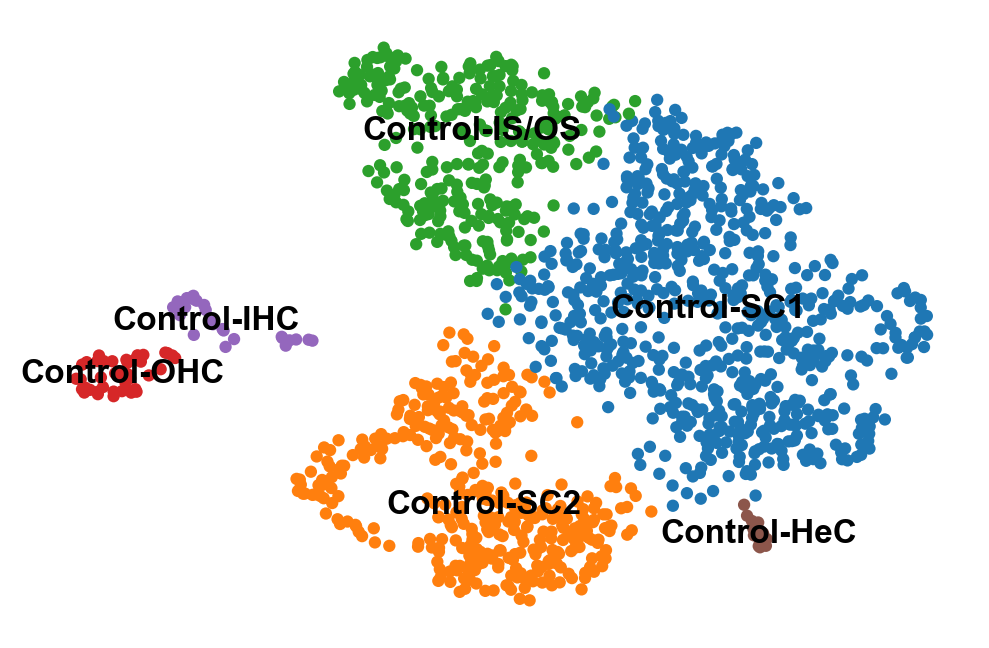

In [64]:
renamed_subclusters = ['Control-SC1', 'Control-SC2', 'Control-IS/OS', 'Control-OHC', 'Control-IHC', 'Control-HeC']
adata_subset.rename_categories('leiden_R', renamed_subclusters)
sc.pl.umap(adata_subset, color='leiden_R', legend_loc='on data', title='', frameon=False, save='.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_R']`


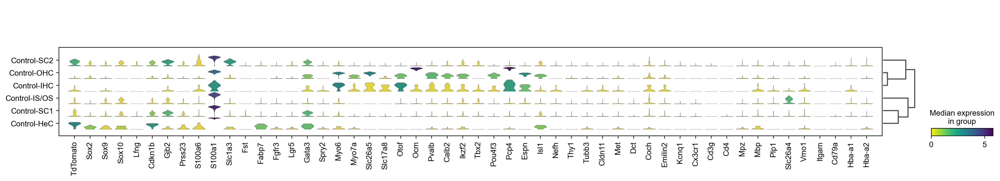

In [65]:
sc.tl.dendrogram(adata_subset, groupby='leiden_R')
sc.pl.stacked_violin(adata_subset, marker_genes, groupby='leiden_R', rotation=90, dendrogram=True,
                      cmap='viridis_r');

In [66]:
#subset results file
sub_results_file = 'C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/ScVelo/scanpy/Jupyter/SCHCControl_subset.h5ad'  # the file that will store the analysis results
adata_subset.write(sub_results_file)

In [67]:
cdata = sc.read_h5ad(filename = 'C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/ScVelo/scanpy/Jupyter/SCHCcHC_subset.h5ad')
cdata

AnnData object with n_obs × n_vars = 1687 × 2651
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [70]:
CtrlSC = adata_subset[adata_subset.obs['leiden_R'].isin(['Control-SC1', 'Control-SC2'])]

In [71]:
CtrlSC

View of AnnData object with n_obs × n_vars = 1116 × 2725
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'neighbors', 'pca', 'umap', 'leiden', 'dendrogram_leiden', 'dendrogram_leiden_R'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


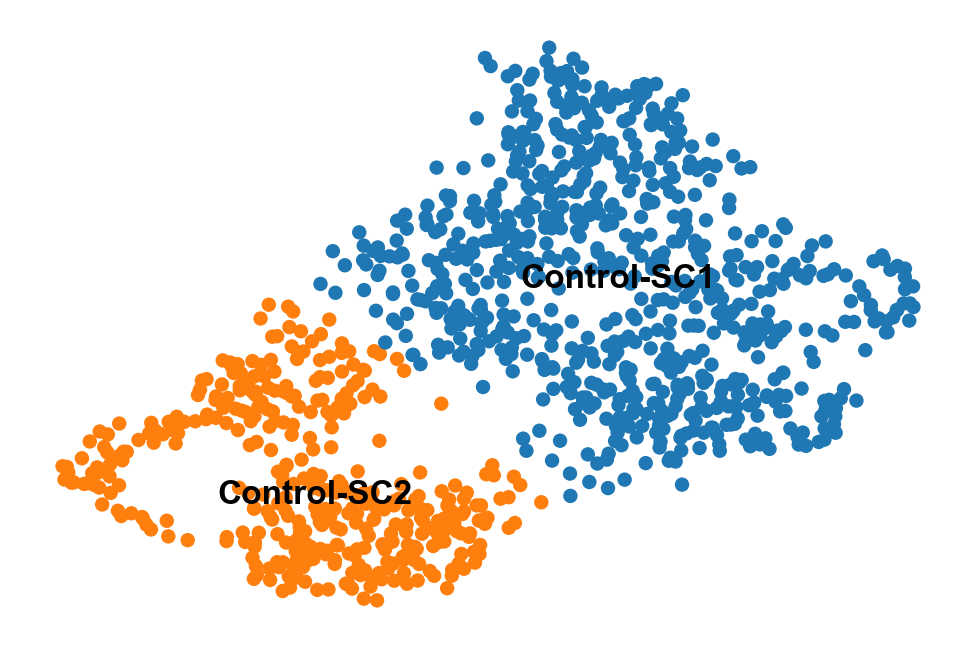

In [73]:
sc.pl.umap(CtrlSC, color='leiden_R', legend_loc='on data', title='', frameon=False)

In [74]:
CockSC = cdata[cdata.obs['leiden_R'].isin(['SC1', 'SC2', 'SC3', 'SC4'])]

In [75]:
CockSC

View of AnnData object with n_obs × n_vars = 1507 × 2651
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


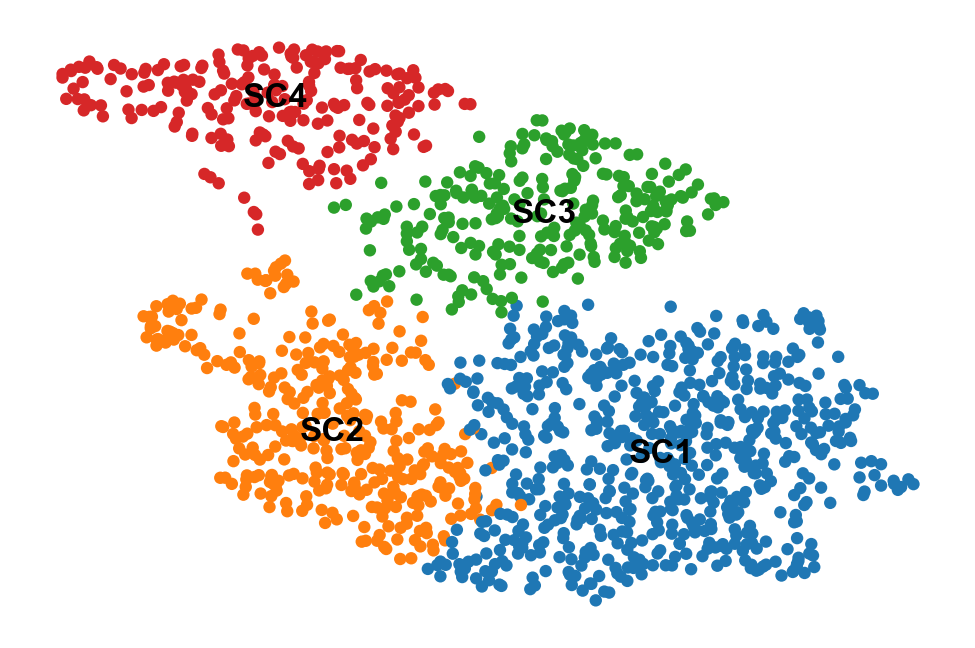

In [77]:
sc.pl.umap(CockSC, color='leiden_R', legend_loc='on data', title='', frameon=False)

In [78]:
var_names = CtrlSC.var_names.intersection(CockSC.var_names)
CtrlSC = CtrlSC[:, var_names]
CockSC = CockSC[:, var_names]

In [79]:
sc.pp.pca(CtrlSC)
sc.pp.neighbors(CtrlSC)
sc.tl.umap(CtrlSC)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


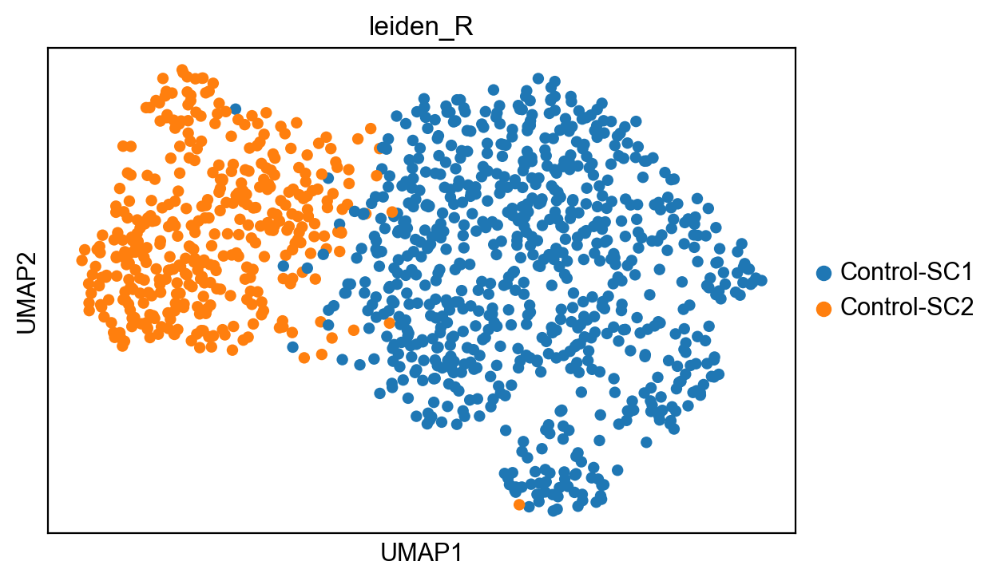

In [81]:
sc.pl.umap(CtrlSC, color='leiden_R')

In [82]:
sc.tl.ingest(CockSC, CtrlSC, obs='leiden_R')

running ingest
    finished (0:00:34)


In [86]:
CockSC

AnnData object with n_obs × n_vars = 1507 × 1546
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'rep'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


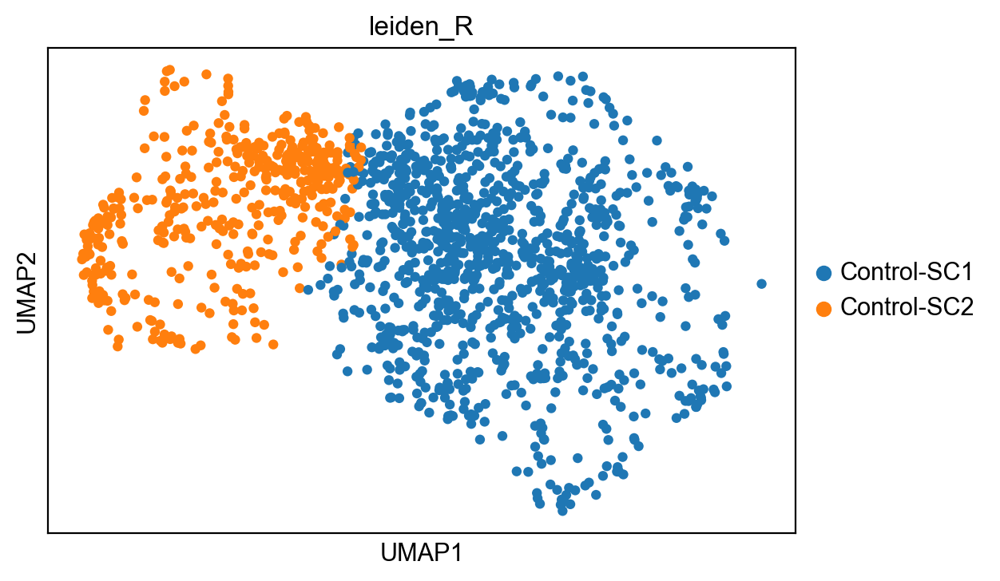

In [85]:
#CockSC.uns['leiden_R'] = CtrlSC.uns['leiden_R']  # fix colors
sc.pl.umap(CockSC, color=['leiden_R'], wspace=0.5)

In [87]:
adata_concat = CtrlSC.concatenate(CockSC, batch_categories=['Control', 'Cocktail'])

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


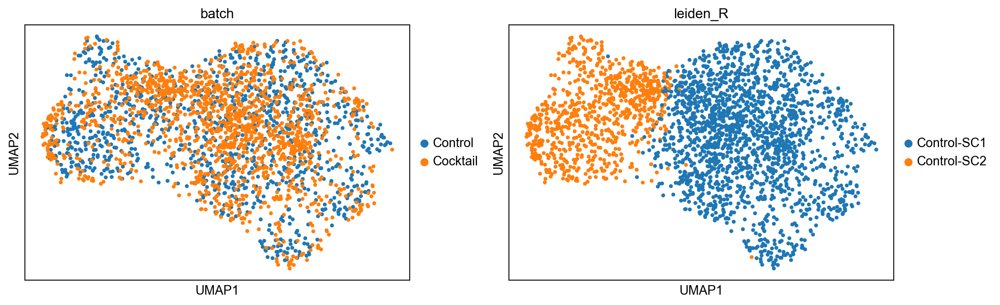

In [88]:
sc.pl.umap(adata_concat, color=['batch', 'leiden_R'])

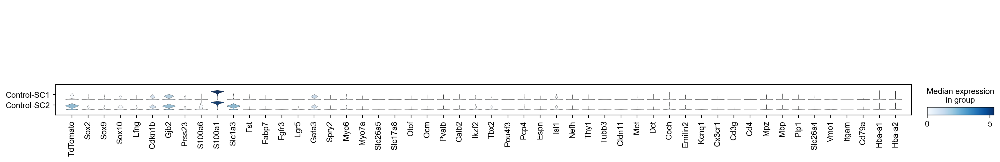

In [89]:
sc.pl.stacked_violin(adata_concat, marker_genes, groupby='leiden_R', rotation=90);

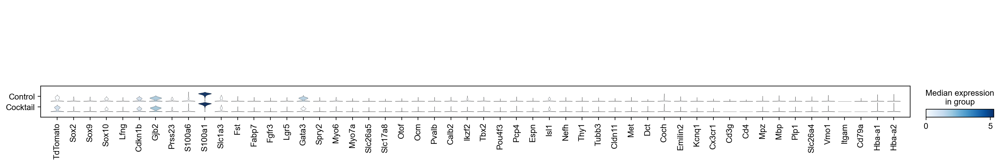

In [90]:
sc.pl.stacked_violin(adata_concat, marker_genes, groupby='batch', rotation=90);

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_batch']`


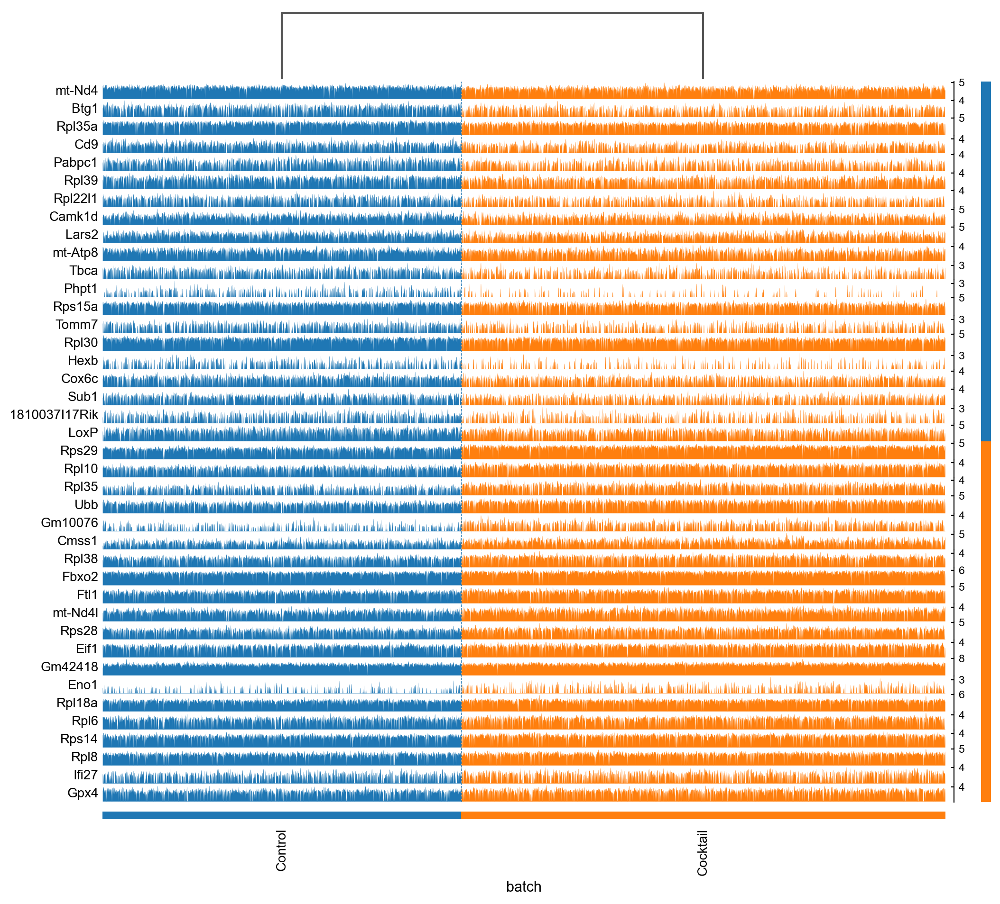

In [91]:
sc.tl.rank_genes_groups(adata_concat, groupby='batch', method='wilcoxon')
sc.pl.rank_genes_groups_tracksplot(adata_concat, n_genes=20, groupby = 'batch', 
                                    values_to_plot='logfoldchanges', rotation = 90)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


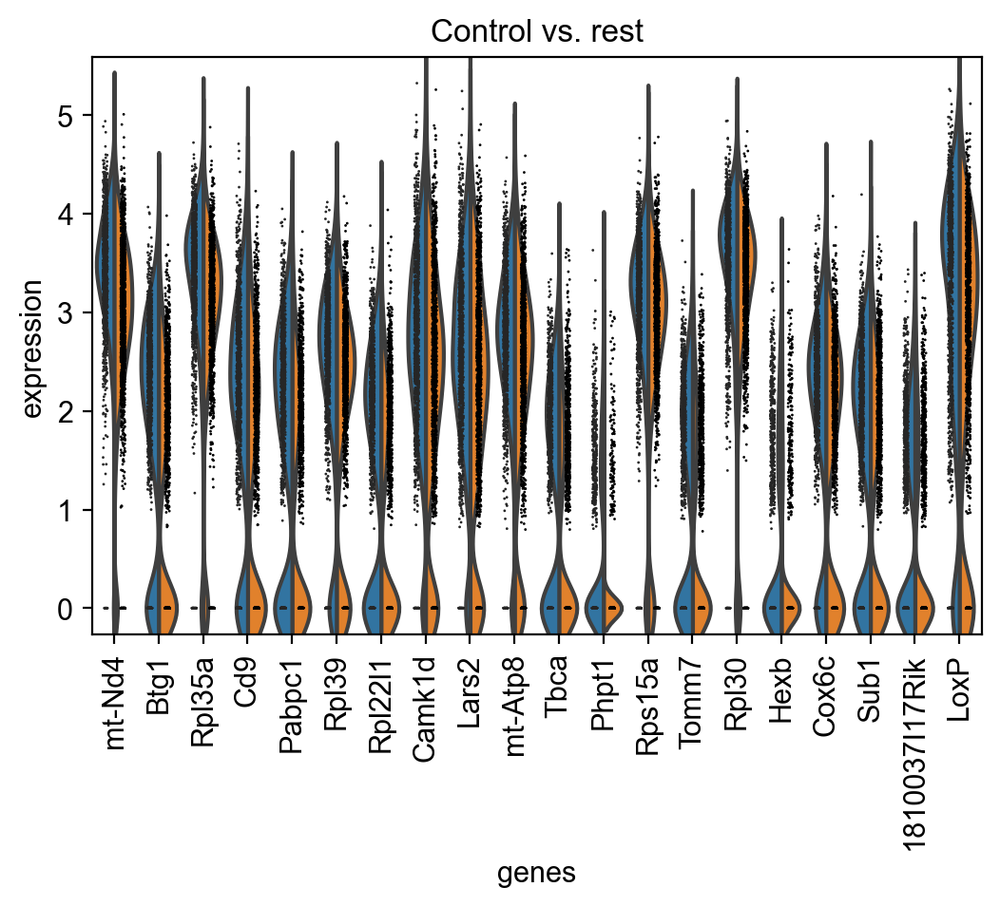

In [94]:
sc.tl.rank_genes_groups(adata_concat, 'batch', groups=['Control'], method='wilcoxon')
sc.pl.rank_genes_groups_violin(adata_concat, groups=['Control'], n_genes=20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


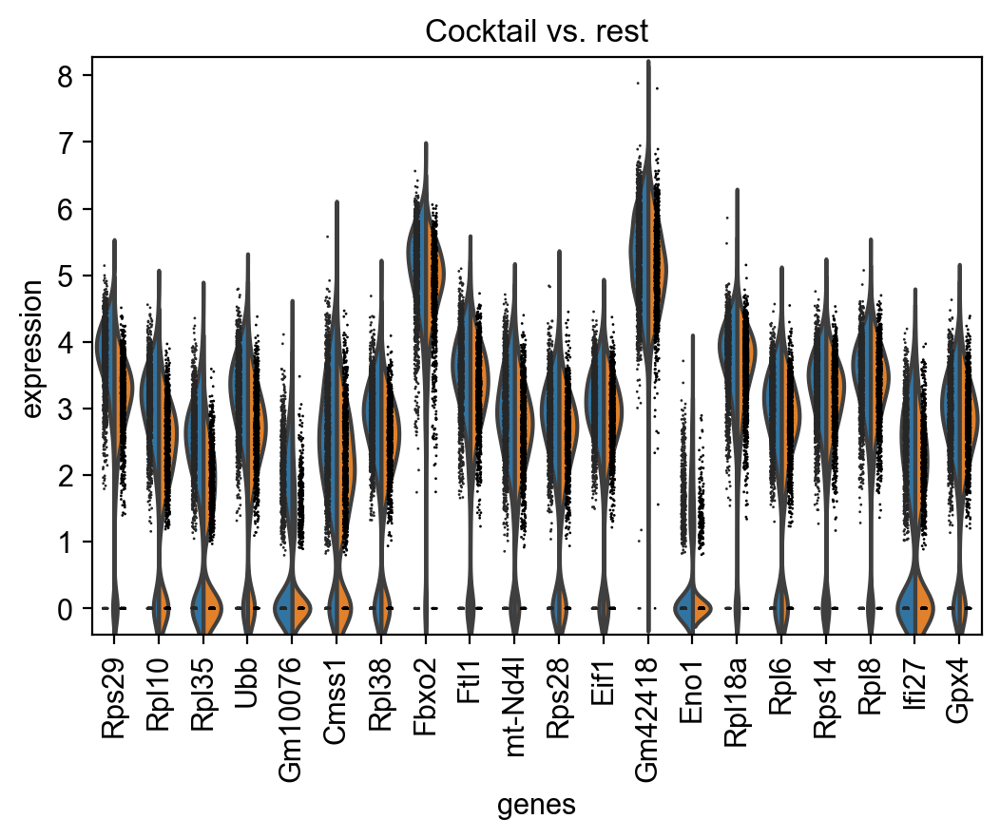

In [95]:
sc.tl.rank_genes_groups(adata_concat, 'batch', groups=['Cocktail'], method='wilcoxon')
sc.pl.rank_genes_groups_violin(adata_concat, groups=['Cocktail'], n_genes=20)

In [96]:
CtrlHC = adata_subset[adata_subset.obs['leiden_R'].isin(['Control-IHC', 'Control-OHC'])]
CtrlHC

View of AnnData object with n_obs × n_vars = 67 × 2725
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'neighbors', 'pca', 'umap', 'leiden', 'dendrogram_leiden', 'dendrogram_leiden_R'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [98]:
CockHC = cdata[cdata.obs['leiden_R'].isin(['IHC', 'OHC'])]
CockHC

View of AnnData object with n_obs × n_vars = 93 × 2651
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


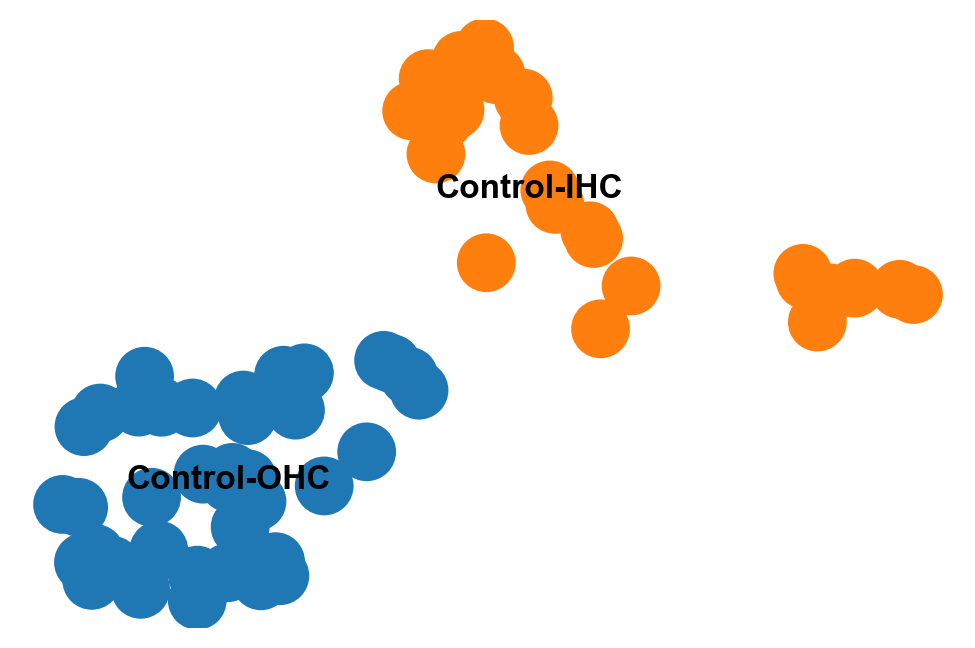

In [97]:
sc.pl.umap(CtrlHC, color='leiden_R', legend_loc='on data', title='', frameon=False)

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


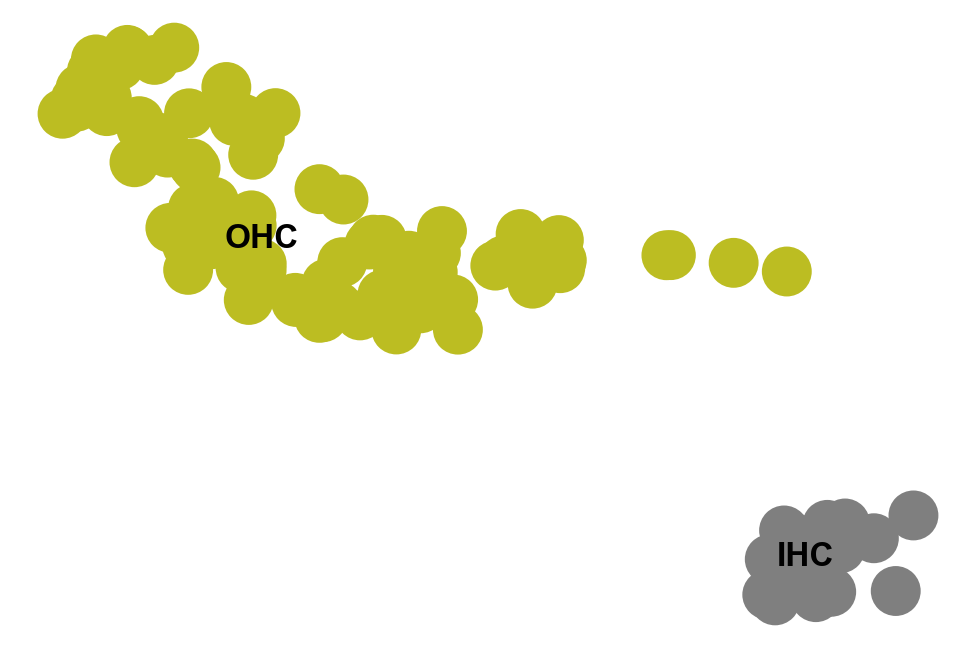

In [99]:
sc.pl.umap(CockHC, color='leiden_R', legend_loc='on data', title='', frameon=False)

In [100]:
var_names = CtrlHC.var_names.intersection(CockHC.var_names)
CtrlHC = CtrlHC[:, var_names]
CockHC = CockHC[:, var_names]

In [101]:
sc.pp.pca(CtrlHC)
sc.pp.neighbors(CtrlHC)
sc.tl.umap(CtrlHC)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


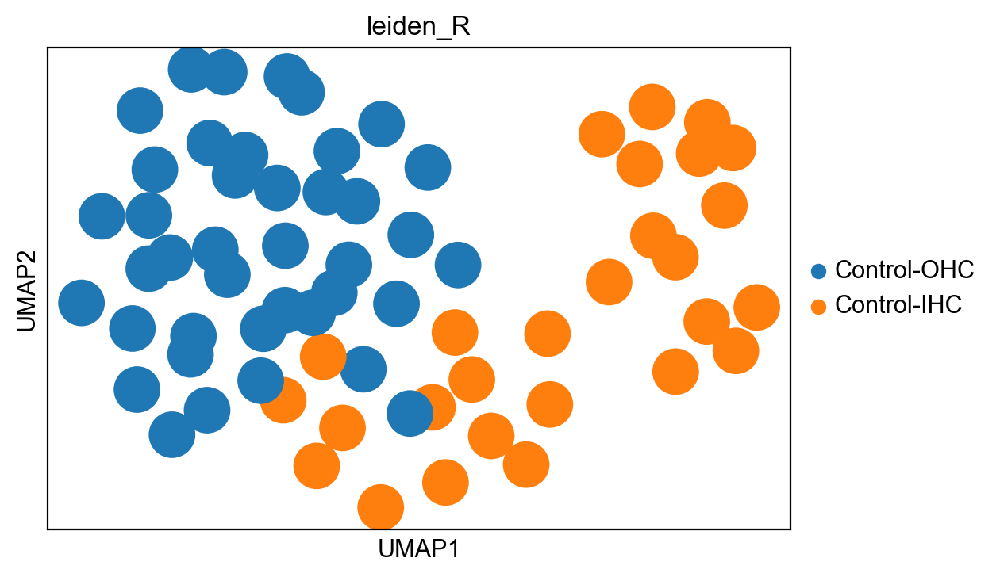

In [102]:
sc.pl.umap(CtrlHC, color='leiden_R')

In [103]:
sc.tl.ingest(CockHC, CtrlHC, obs='leiden_R')

running ingest
    finished (0:00:02)


In [104]:
CockHC

AnnData object with n_obs × n_vars = 93 × 1546
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'dendrogram_leiden_R', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'rep'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


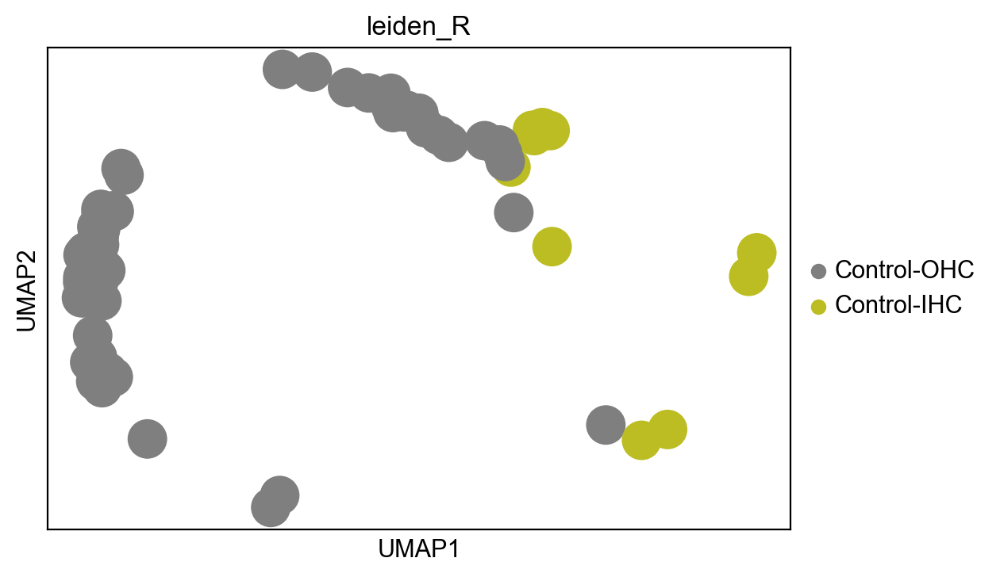

In [105]:
#CockSC.uns['leiden_R'] = CtrlSC.uns['leiden_R']  # fix colors
sc.pl.umap(CockHC, color=['leiden_R'], wspace=0.5)

In [106]:
adata_concat = CtrlHC.concatenate(CockHC, batch_categories=['Control', 'Cocktail'])

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


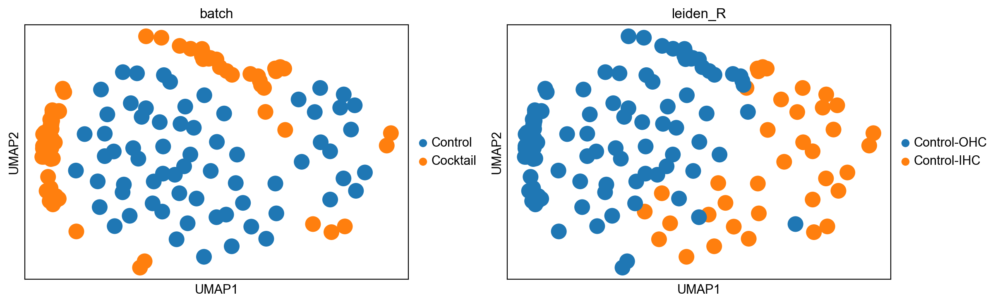

In [107]:
sc.pl.umap(adata_concat, color=['batch', 'leiden_R'])

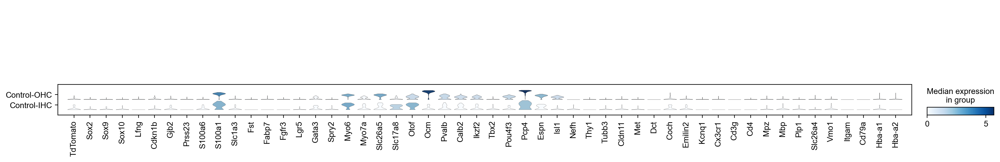

In [108]:
sc.pl.stacked_violin(adata_concat, marker_genes, groupby='leiden_R', rotation=90);

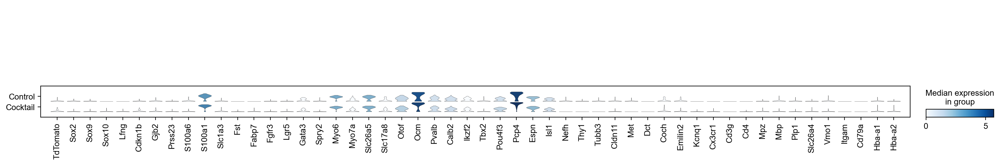

In [109]:
sc.pl.stacked_violin(adata_concat, marker_genes, groupby='batch', rotation=90);

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


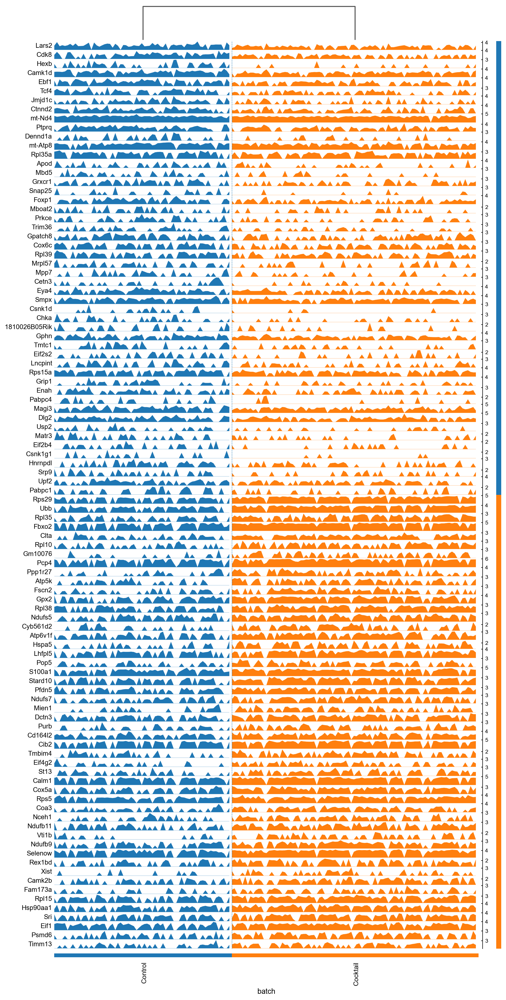

In [113]:
sc.tl.rank_genes_groups(adata_concat, groupby='batch', method='wilcoxon')
sc.pl.rank_genes_groups_tracksplot(adata_concat, n_genes=50, groupby = 'batch', 
                                    values_to_plot='logfoldchanges', rotation = 90)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


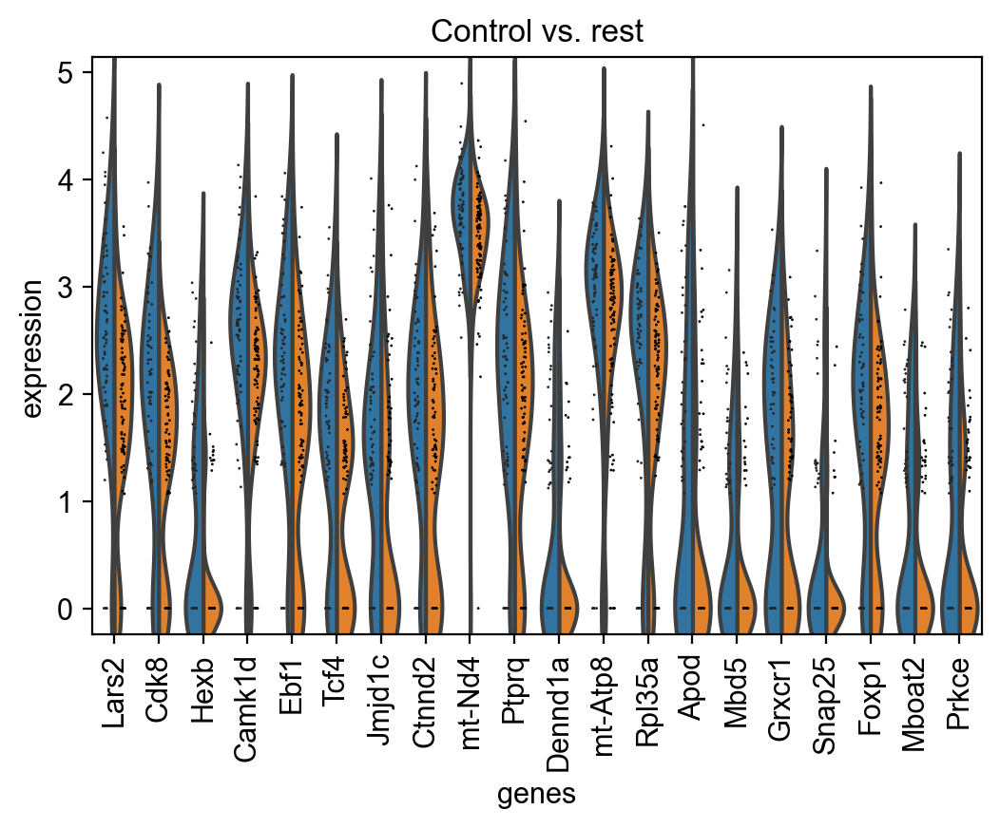

In [111]:
sc.tl.rank_genes_groups(adata_concat, 'batch', groups=['Control'], method='wilcoxon')
sc.pl.rank_genes_groups_violin(adata_concat, groups=['Control'], n_genes=20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


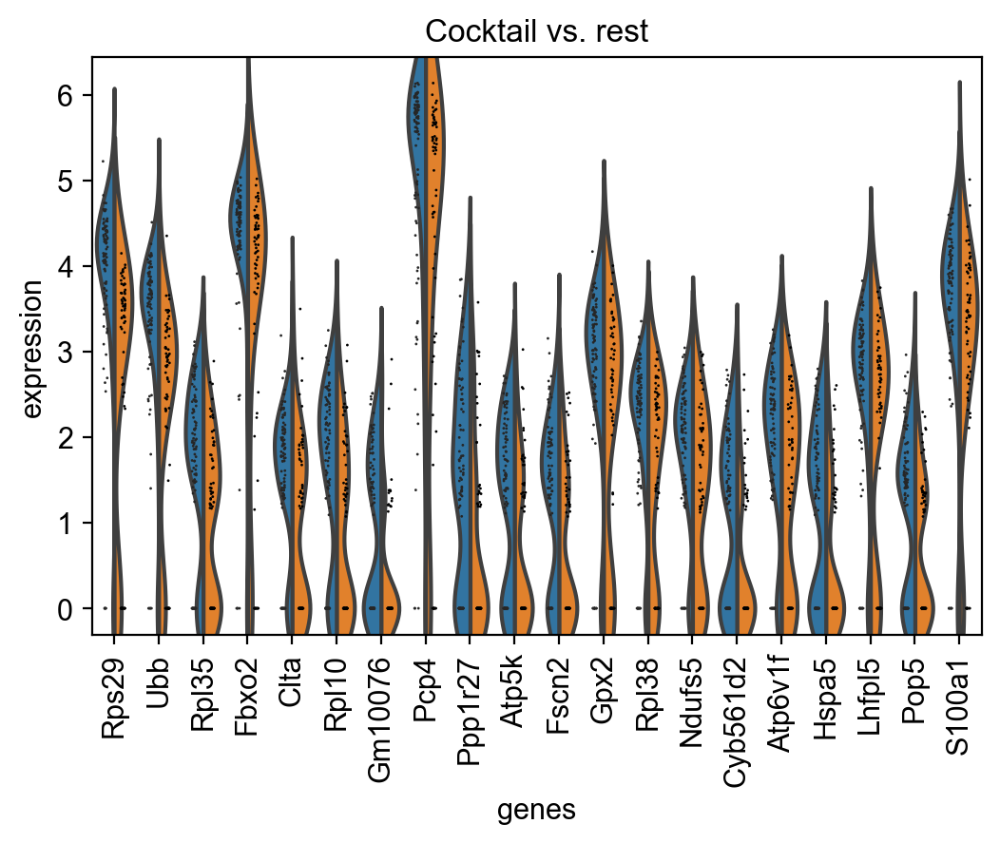

In [112]:
sc.tl.rank_genes_groups(adata_concat, 'batch', groups=['Cocktail'], method='wilcoxon')
sc.pl.rank_genes_groups_violin(adata_concat, groups=['Cocktail'], n_genes=20)

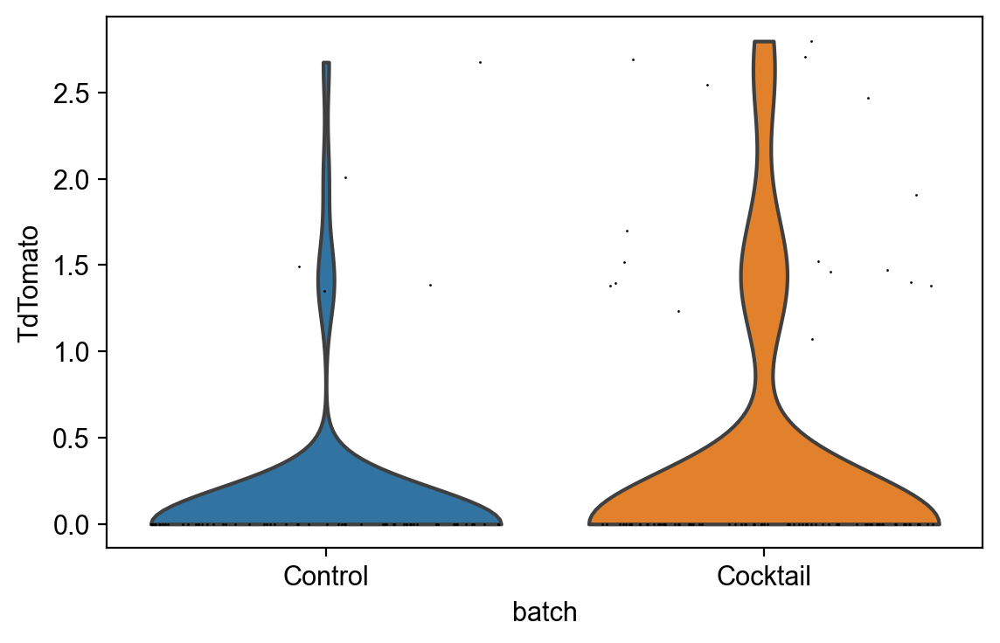

In [114]:
sc.pl.violin(adata_concat, ['TdTomato'], groupby='batch',
             jitter=0.4)

In [117]:
adata_concat.obs['batch'].value_counts()

batch
Cocktail    93
Control     67
Name: count, dtype: int64